In [10]:
from my_utils.base_data_handler import BaseDataHandler #type: ignore
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

In [11]:
handler = BaseDataHandler('dataset.csv')

In [12]:
handler.df.nunique()

Unnamed: 0          114000
track_id             89741
artists              31437
album_name           46589
track_name           73608
popularity             101
duration_ms          50697
explicit                 2
danceability          1174
energy                2083
key                     12
loudness             19480
mode                     2
speechiness           1489
acousticness          5061
instrumentalness      5346
liveness              1722
valence               1790
tempo                45653
time_signature           5
track_genre            114
dtype: int64

In [13]:
handler.try_add_col(target_col='target', func= lambda _: False)

(True, None)

In [14]:
handler.df.drop(columns= ['Unnamed: 0'], inplace=True)

In [15]:
handler.df.dropna(inplace=True)
handler.df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113999 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          113999 non-null  object 
 1   artists           113999 non-null  object 
 2   album_name        113999 non-null  object 
 3   track_name        113999 non-null  object 
 4   popularity        113999 non-null  int64  
 5   duration_ms       113999 non-null  int64  
 6   explicit          113999 non-null  bool   
 7   danceability      113999 non-null  float64
 8   energy            113999 non-null  float64
 9   key               113999 non-null  int64  
 10  loudness          113999 non-null  float64
 11  mode              113999 non-null  int64  
 12  speechiness       113999 non-null  float64
 13  acousticness      113999 non-null  float64
 14  instrumentalness  113999 non-null  float64
 15  liveness          113999 non-null  float64
 16  valence           113999 

In [16]:
sorted = handler.df.sort_values('track_genre')
sorted['track_genre'].unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie', 'indie-pop', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop', 'pop-film',
       'pow

In [17]:
handler.df.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,113999.000000,1.139990e+05,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000
mean,33.238827,2.280312e+05,0.566801,0.641383,5.309126,-8.258950,0.637558,0.084652,0.314907,0.156051,0.213554,0.474066,122.147695,3.904034
std,22.304959,1.072961e+05,0.173543,0.251530,3.559999,5.029357,0.480708,0.105733,0.332522,0.309556,0.190378,0.259261,29.978290,0.432623
min,0.000000,8.586000e+03,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218500,4.000000
50%,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.597500,0.049000,0.273000,0.683000,140.071000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


(<Figure size 1800x2500 with 14 Axes>,
 array([<Axes: title={'center': 'Outliers in popularity (percentile)'}, xlabel='popularity'>,
        <Axes: title={'center': 'Outliers in duration_ms (percentile)'}, xlabel='duration_ms'>,
        <Axes: title={'center': 'Outliers in danceability (percentile)'}, xlabel='danceability'>,
        <Axes: title={'center': 'Outliers in energy (percentile)'}, xlabel='energy'>,
        <Axes: title={'center': 'Outliers in key (percentile)'}, xlabel='key'>,
        <Axes: title={'center': 'Outliers in loudness (percentile)'}, xlabel='loudness'>,
        <Axes: title={'center': 'Outliers in mode (percentile)'}, xlabel='mode'>,
        <Axes: title={'center': 'Outliers in speechiness (percentile)'}, xlabel='speechiness'>,
        <Axes: title={'center': 'Outliers in acousticness (percentile)'}, xlabel='acousticness'>,
        <Axes: title={'center': 'Outliers in instrumentalness (percentile)'}, xlabel='instrumentalness'>,
        <Axes: title={'center': 'Ou

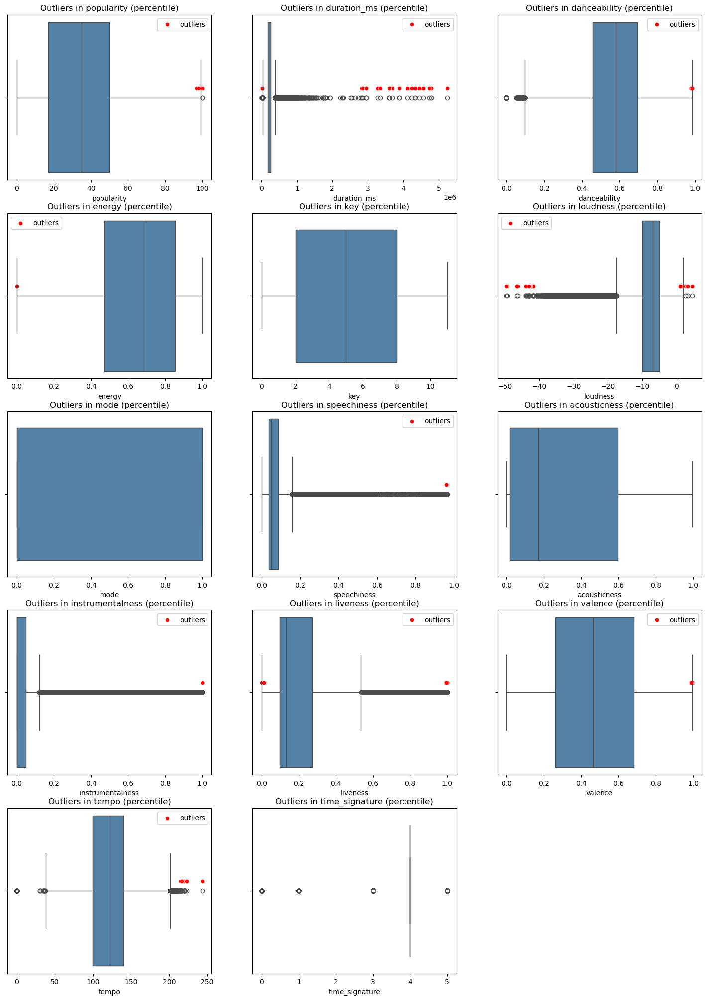

In [18]:
handler.get_outlier_case_study(upper_percentile=.9998, lower_percentile=.0002)

In [19]:
mask = handler.df['duration_ms'] > 3e6
handler.df[mask]

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,target
10739,1HsXpX34EY1c1PaZQIMgdh,Deekline;Ed Solo;Serial Killaz,Welcome To The Jungle: Drum & Bass X Jungle: M...,"Welcome To The Jungle - Continuous DJ Mix, Pt. 1",11,3274999,False,0.6110,0.913000,1,...,1,0.0624,0.000645,0.034400,0.0598,0.41700,175.009,4,breakbeat,False
10935,0LBIf9EFHuxmuNig4JHGZo,Timo Maas,Crossing Wires 002 - Compiled And Mixed By Tim...,Crossing Wires 002 - Continuous DJ Mix,11,4789026,False,0.6970,0.632000,1,...,1,0.0451,0.008150,0.871000,0.0998,0.15100,121.055,4,breakbeat,False
10984,0LBIf9EFHuxmuNig4JHGZo,Timo Maas,Crossing Wires 002 - Compiled And Mixed By Tim...,Crossing Wires 002 - Continuous DJ Mix,11,4789026,False,0.6970,0.632000,1,...,1,0.0451,0.008150,0.871000,0.0998,0.15100,121.055,4,breakbeat,False
13195,3se0UYprtkHthJEBuk1A5K,Mark Farina,Greenhouse Construction,Greenhouse Construction,12,4334721,False,0.8460,0.744000,10,...,0,0.0611,0.003710,0.335000,0.3130,0.53200,125.434,4,chicago-house,False
13245,13hQAhg1owjTpTcI9xQc6c,Mark Farina,Live In Tokyo,Live In Tokyo - Continuous Mix,11,4339826,False,0.8060,0.582000,1,...,1,0.0874,0.008300,0.237000,0.3280,0.68600,128.368,4,chicago-house,False
13344,3gFme8BdfTtFHxKmuTnSbj,Mark Farina,House of OM (DJ Mix),House of Om - Mark Farina - Continuous Mix,11,4447520,False,0.8610,0.805000,11,...,0,0.0711,0.005480,0.577000,0.1350,0.54500,129.306,4,chicago-house,False
24348,6wypxnAvmv5zYewUX3VFDd,Seth Troxler,Seth Troxler - The Lab 03,The Lab 03 - Continuous DJ Mix Part 1,8,4730302,False,0.6840,0.656000,5,...,0,0.0633,0.019100,0.848000,0.1030,0.30100,123.180,4,detroit-techno,False
24747,0nfqrZDDv09LW2U6KexnAg,Kevin Saunderson,History Elevate Remixed,Kevin Saunderson History Elevate - Continuous Mix,5,3676760,False,0.7150,0.901000,10,...,0,0.0497,0.004370,0.786000,0.0596,0.30400,130.008,4,detroit-techno,False
27926,6eTDnsdPlRUyrTHqFj3l7W,Lenzman;Dan Stezo,NQ State of Mind,"NQ State of Mind, Vol. 1 - Continuous DJ Mix",15,4246206,True,0.5930,0.924000,1,...,1,0.0899,0.003690,0.022100,0.5340,0.24200,173.938,4,drum-and-bass,False
45063,0PINNy1r5eEILOuHpnjl5d,Estas Tonne,Internal Flight (Remastered),Internal Flight (Remastered),47,3876276,False,0.3000,0.640000,4,...,0,0.0367,0.946000,0.893000,0.0783,0.21200,159.624,4,guitar,False


In [20]:
no_outliers_df = handler.get_no_outliers_df(upper_percentile=.9998, lower_percentile=.0002)
handler.df = no_outliers_df.copy()
handler.df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113736 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          113736 non-null  object 
 1   artists           113736 non-null  object 
 2   album_name        113736 non-null  object 
 3   track_name        113736 non-null  object 
 4   popularity        113736 non-null  int64  
 5   duration_ms       113736 non-null  int64  
 6   explicit          113736 non-null  bool   
 7   danceability      113736 non-null  float64
 8   energy            113736 non-null  float64
 9   key               113736 non-null  int64  
 10  loudness          113736 non-null  float64
 11  mode              113736 non-null  int64  
 12  speechiness       113736 non-null  float64
 13  acousticness      113736 non-null  float64
 14  instrumentalness  113736 non-null  float64
 15  liveness          113736 non-null  float64
 16  valence           113736 

C:\Users\m-rog\Downloads\my_utils\my_utils\base_data_handler.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp_df.dropna(inplace=True)


In [21]:
#handler.df['duration_ms'] = handler.df_log['duration_ms']

In [22]:
#handler.get_outlier_case_study()


In [23]:
mask = handler.df['time_signature'] < 1
handler.df['time_signature'] = handler.df['time_signature'].replace(0,4)
handler.df[mask]

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,target
2926,0jdfbvSdaWvxfAlD20TtNc,Yaşlı Amca,Akşamüstü,Sanki Yapamadım,44,213198,False,0.442,0.56700,8,...,0,0.0516,0.238000,0.000325,0.0852,0.639,138.616,4,alt-rock,False
4131,59gg6zQhSKGVnkT3hWAY3l,Max Richter;Lang Lang,Voyager - Essential Max Richter,The Departure,64,151506,False,0.000,0.03620,0,...,0,0.0000,0.994000,0.940000,0.0958,0.000,0.000,4,ambient,False
4379,4acmzQsAeMJa5sGFSog7fu,Dario Marianelli;Jack Liebeck;Benjamin Wallfisch,Jane Eyre - Original Motion Picture Soundtrack,The End of Childhood (feat. Jack Liebeck),55,73266,False,0.000,0.04450,0,...,0,0.0000,0.972000,0.972000,0.0873,0.000,0.000,4,ambient,False
4664,1Kb2DqjHRvOcT5xeWtz3t5,Sylvain Chauveau,Des Plumes Dans La Tête,Ferme Les Yeux,53,68493,False,0.000,0.03230,2,...,0,0.0000,0.994000,0.973000,0.0922,0.000,0.000,4,ambient,False
26910,7HSc2wpHlXKIl8SCZK7zsP,Benny Martin,Here Comes the Sun (Piano Instrumental),Here Comes the Sun (Piano Instrumental),18,203705,False,0.329,0.06070,9,...,1,0.0507,0.994000,0.880000,0.0858,0.421,93.948,4,disney,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101988,5gEKRH0MCSegG8ZISUPaU2,Granular,The World Of,Tin White Noise,32,182050,False,0.000,0.00002,1,...,1,0.0000,0.003850,0.903000,0.9210,0.000,0.000,4,sleep,False
101993,6H0kAiSAFB84jX7dgEDWd6,Rain Sounds,Rain,Rain: Natural Recording,32,84219,False,0.000,0.02540,8,...,1,0.0000,0.000002,0.838000,0.3390,0.000,0.000,4,sleep,False
112172,0jdfbvSdaWvxfAlD20TtNc,Yaşlı Amca,Akşamüstü,Sanki Yapamadım,44,213198,False,0.442,0.56700,8,...,0,0.0516,0.238000,0.000325,0.0852,0.639,138.616,4,turkish,False
113428,5EYzrykQ95uOmepteDi9KT,El Ruido Blanco;Soñoliento Juan;Mantra para Do...,Aire Acondicionado de Ruido Blanco,Aire de verano,27,128000,False,0.000,0.18800,8,...,0,0.0000,0.139000,0.339000,0.1220,0.000,0.000,4,world-music,False


In [24]:
dup_ids = handler.df[handler.df.duplicated(subset='track_id', keep=False)]
dup_ids = dup_ids.sort_values('track_id')
dup_ids.groupby('track_id').nunique()

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,target
track_id,,,,,,,,,,,,,,,,,,,,
001APMDOl3qtx1526T11n1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1
001YQlnDSduXd5LgBd66gT,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1
003vvx7Niy0yvhvHt4a68B,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,3,1
004h8smbIoAkUNDJvVKwkG,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1
006rHBBNLJMpQs8fRC2GDe,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7ztSVy67w9rXpKg5L2zN5l,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1
7zubR9uYAWjb5KPZTMm85e,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,4,1
7zumacGldlmxpoP8bpaeLe,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1


## studio duplicati

In [26]:
df = handler.df

In [54]:
# maschera dei duplicati completi (esclude la prima occorrenza)
dup_mask = df.duplicated(keep='first')

# numero di righe duplicate
n_dup = dup_mask.sum()

print(f"Numero di righe duplicate complete: {n_dup}")

df= df.drop_duplicates(keep='first')

print(f"sono state eliminate le {n_dup} righe duplicate complete!")


Numero di righe duplicate complete: 449
sono state eliminate le 449 righe duplicate complete!


In [ ]:
#duplicati per 'track_id'

dup_ids = df[df.duplicated(subset='track_id', keep=False)]
dup_ids = dup_ids.sort_values('track_id')
dup_ids.groupby('track_id').nunique()


,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,target
track_id,,,,,,,,,,,,,,,,,,,,
001APMDOl3qtx1526T11n1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1
001YQlnDSduXd5LgBd66gT,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1
003vvx7Niy0yvhvHt4a68B,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,3,1
004h8smbIoAkUNDJvVKwkG,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1
006rHBBNLJMpQs8fRC2GDe,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7ztSVy67w9rXpKg5L2zN5l,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1
7zubR9uYAWjb5KPZTMm85e,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,4,1
7zumacGldlmxpoP8bpaeLe,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1


In [56]:
g = dup_ids.groupby('track_id')

same_genre = g.filter(
    lambda x: x['track_genre'].nunique() == 1
)

In [61]:
pd.set_option('display.max_columns', None)
print(f'I duplicati pe "track_id" che non differiscono per genere sono: {len(same_genre)}')

I duplicati pe "track_id" che non differiscono per genere sono: 0


## one hot encoding raggruppato per generi (alcune canzoni avranno più generi) 

### esempio

| track_id | rock | blues | pop | metal |
|----------|------|-------|-----|-------|
| A        | 0    | 1     | 1   | 0     |
| B        | 0    | 1     | 0   | 0     |
| C        | 1    | 0     | 0   | 1     |




In [78]:
genre_ohe = (
    pd.get_dummies(df['track_genre'])
    .groupby(df['track_id'])
    .max()
)

df_hot_enc = (
    df
    .drop(columns='track_genre')
    .drop_duplicates('track_id')
    .merge(genre_ohe, on='track_id')
)


In [79]:
df_hot_enc

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,target,acoustic,afrobeat,alt-rock,alternative,ambient,anime,black-metal,bluegrass,blues,brazil,breakbeat,british,cantopop,chicago-house,children,chill,classical,club,comedy,country,dance,dancehall,death-metal,deep-house,detroit-techno,disco,disney,drum-and-bass,dub,dubstep,edm,electro,electronic,emo,folk,forro,french,funk,garage,german,gospel,goth,grindcore,groove,grunge,guitar,happy,hard-rock,hardcore,hardstyle,heavy-metal,hip-hop,honky-tonk,house,idm,indian,indie,indie-pop,industrial,iranian,j-dance,j-idol,j-pop,j-rock,jazz,k-pop,kids,latin,latino,malay,mandopop,metal,metalcore,minimal-techno,mpb,new-age,opera,pagode,party,piano,pop,pop-film,power-pop,progressive-house,psych-rock,punk,punk-rock,r-n-b,reggae,reggaeton,rock,rock-n-roll,rockabilly,romance,sad,salsa,samba,sertanejo,show-tunes,singer-songwriter,ska,sleep,songwriter,soul,spanish,study,swedish,synth-pop,tango,techno,trance,trip-hop,turkish,world-music
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fa

In [ ]:
# old version: rimozione randomica outliers
''''handler.df.drop_duplicates(subset=['track_id'], inplace=True)
handler.df.info()'''

<class 'pandas.core.frame.DataFrame'>
Index: 89515 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_id          89515 non-null  object 
 1   artists           89515 non-null  object 
 2   album_name        89515 non-null  object 
 3   track_name        89515 non-null  object 
 4   popularity        89515 non-null  int64  
 5   duration_ms       89515 non-null  int64  
 6   explicit          89515 non-null  bool   
 7   danceability      89515 non-null  float64
 8   energy            89515 non-null  float64
 9   key               89515 non-null  int64  
 10  loudness          89515 non-null  float64
 11  mode              89515 non-null  int64  
 12  speechiness       89515 non-null  float64
 13  acousticness      89515 non-null  float64
 14  instrumentalness  89515 non-null  float64
 15  liveness          89515 non-null  float64
 16  valence           89515 non-null  float64
 1

In [63]:
handler.df.dropna(inplace=True)

'''cols_to_normalize = ['danceability','energy','valence','tempo','loudness','acousticness','instrumentalness','liveness','speechiness']

mask = [col for col in handler.df.columns if col in cols_to_normalize]

scaler = StandardScaler()
handler.df[mask] = scaler.fit_transform(handler.df[mask])'''


"cols_to_normalize = ['danceability','energy','valence','tempo','loudness','acousticness','instrumentalness','liveness','speechiness']\n\nmask = [col for col in handler.df.columns if col in cols_to_normalize]\n\nscaler = StandardScaler()\nhandler.df[mask] = scaler.fit_transform(handler.df[mask])"

In [65]:
handler.try_update_og_df()
handler.try_save_to_csv()

(True, None)

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [67]:
df.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre', 'target'],
      dtype='object')

In [95]:
df_ready = df_hot_enc.drop(columns=['track_id', 'artists', 'album_name', 'track_name', 'target'])

In [96]:
X = df_ready.select_dtypes(include=['number'])


In [97]:
col_to_scale = df_ready.select_dtypes(include=['number']).columns
scaler = StandardScaler()
X_scaled = X.copy()
X_scaled[col_to_scale] = scaler.fit_transform(X[col_to_scale])

In [92]:
X_scaled_sample = X_scaled.sample(
    n=10000,
    random_state=42
)
df_sample = df.sample(
    n=10000,
    random_state=42
)

## K-means

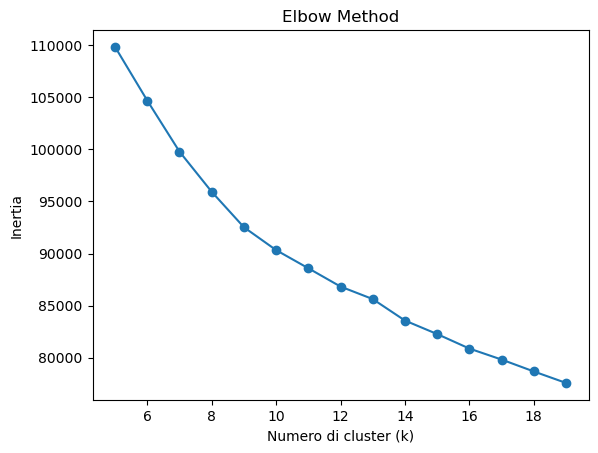

In [ ]:
inertia = []
K = range(5, 20)

for k in K:
    kmeans = KMeans(
        n_clusters=k,
        n_init=20,
        random_state=42
    )
    kmeans.fit(X_scaled_sample)
    inertia.append(kmeans.inertia_)

plt.figure()
plt.plot(K, inertia, marker='o')
plt.xlabel('Numero di cluster (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

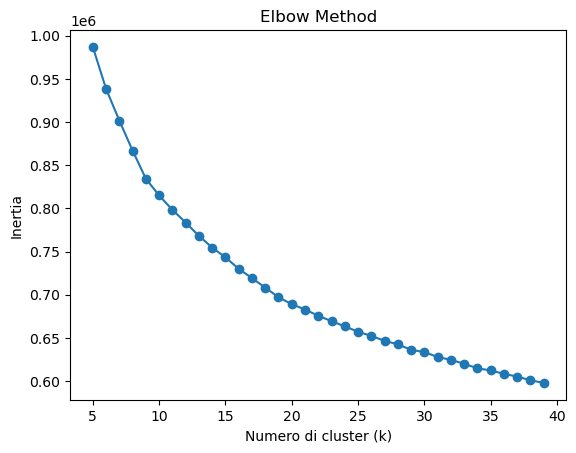

In [ ]:
inertia = []
K = range(5, 40)

for k in K:
    kmeans = KMeans(
        n_clusters=k,
        n_init=20,
        random_state=42
    )
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.figure()
plt.plot(K, inertia, marker='o')
plt.xlabel('Numero di cluster (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

In [ ]:
silhouette = []

for k in range(2, 15):
    kmeans = KMeans(
        n_clusters=k,
        n_init=20,
        random_state=42
    )
    labels = kmeans.fit_predict(X_scaled)
    silhouette.append(silhouette_score(X_scaled, labels, sample_size=10000, random_state=42))
    



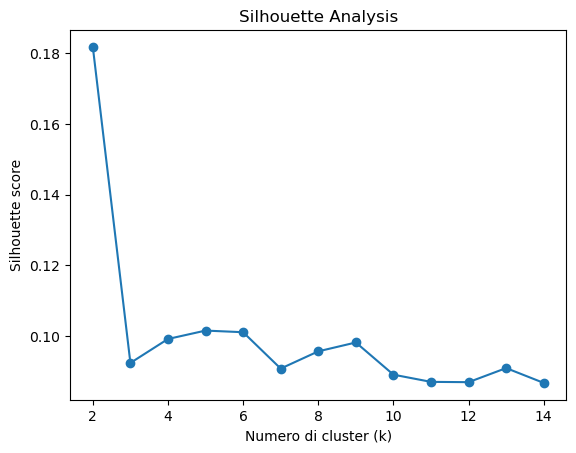

In [ ]:
plt.figure()
plt.plot(range(2, 15), silhouette, marker='o')
plt.xlabel('Numero di cluster (k)')
plt.ylabel('Silhouette score')
plt.title('Silhouette Analysis')
plt.show()

In [101]:
k_opt = 3  # <-- metti quello scelto dall’elbow

kmeans_final = KMeans(
    n_clusters=k_opt,
    n_init=50,
    random_state=42
)

df_hot_enc['cluster'] = kmeans_final.fit_predict(X_scaled)


Varianza spiegata da ciascuna componente PCA:
  PC1: 0.2117
  PC2: 0.1115
  PC3: 0.0926
  PC4: 0.0834
  PC5: 0.0742
  PC6: 0.0709
  PC7: 0.0631
  PC8: 0.0623
  PC9: 0.0594
  PC10: 0.0554
  PC11: 0.0511
  PC12: 0.0314
  PC13: 0.0232
  PC14: 0.0099


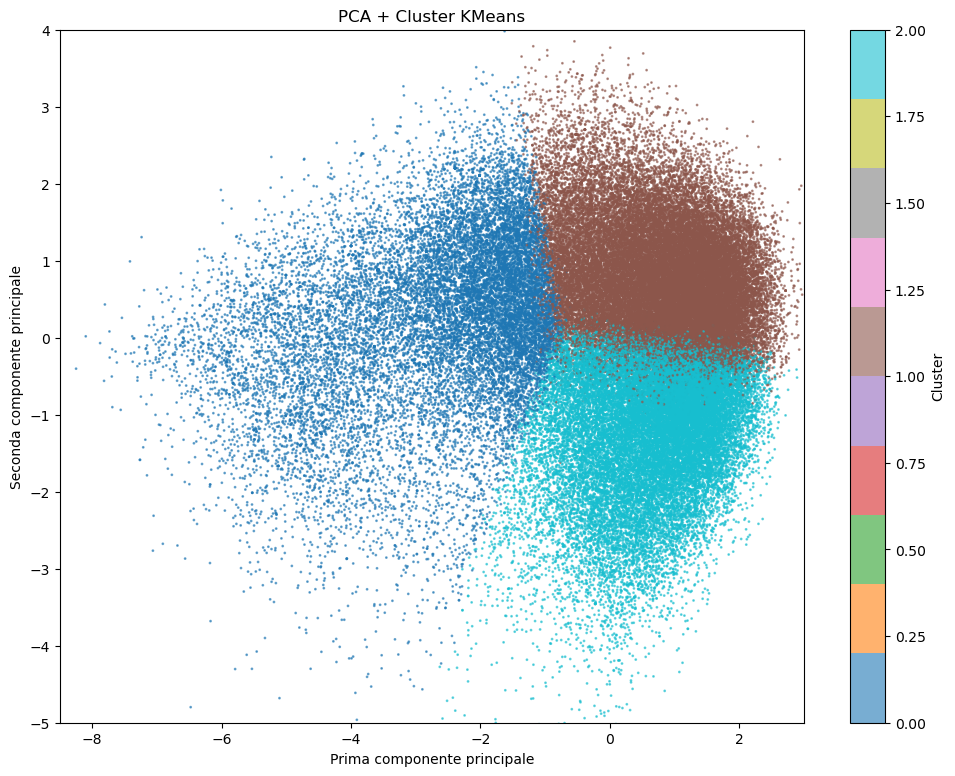

In [102]:
from sklearn.decomposition import PCA

# 3. PCA (prendiamo tutte le componenti ma poi plottiamo solo le prime 2)
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Varianza spiegata
explained_var = pca.explained_variance_ratio_

print("Varianza spiegata da ciascuna componente PCA:")
for i, v in enumerate(explained_var):
    print(f"  PC{i+1}: {v:.4f}")

# 4. Scatter plot delle prime due componenti
plt.figure(figsize=(12,9))
plt.scatter(
    X_pca[:,0],
    X_pca[:,1],
    c=df_hot_enc['cluster'],        # Colore in base al cluster
    cmap='tab10',           # Puoi cambiare mappa colori
    s=1,                    # dimensione punti leggermente più visibile
    alpha=0.6
)
plt.xlabel("Prima componente principale")
plt.ylabel("Seconda componente principale")
plt.xlim(-8.5,3)
plt.ylim(-5,4)
plt.title("PCA + Cluster KMeans")
plt.colorbar(label='Cluster')  # legenda colori
plt.show()

## PCA (principal component analisys)

Varianza spiegata da ciascuna componente PCA:
  PC1: 0.1972
  PC2: 0.1039
  PC3: 0.0865
  PC4: 0.0776
  PC5: 0.0691
  PC6: 0.0660
  PC7: 0.0588
  PC8: 0.0580
  PC9: 0.0553
  PC10: 0.0518
  PC11: 0.0477
  PC12: 0.0293
  PC13: 0.0216
  PC14: 0.0093
  PC15: 0.0045
  PC16: 0.0007
  PC17: 0.0007
  PC18: 0.0007
  PC19: 0.0007
  PC20: 0.0007
  PC21: 0.0007
  PC22: 0.0007
  PC23: 0.0007
  PC24: 0.0007
  PC25: 0.0007
  PC26: 0.0007
  PC27: 0.0007
  PC28: 0.0007
  PC29: 0.0007
  PC30: 0.0007
  PC31: 0.0007
  PC32: 0.0007
  PC33: 0.0007
  PC34: 0.0007
  PC35: 0.0007
  PC36: 0.0007
  PC37: 0.0007
  PC38: 0.0007
  PC39: 0.0007
  PC40: 0.0007
  PC41: 0.0007
  PC42: 0.0007
  PC43: 0.0007
  PC44: 0.0007
  PC45: 0.0007
  PC46: 0.0007
  PC47: 0.0007
  PC48: 0.0007
  PC49: 0.0007
  PC50: 0.0007
  PC51: 0.0007
  PC52: 0.0007
  PC53: 0.0007
  PC54: 0.0007
  PC55: 0.0007
  PC56: 0.0007
  PC57: 0.0007
  PC58: 0.0007
  PC59: 0.0007
  PC60: 0.0007
  PC61: 0.0007
  PC62: 0.0007
  PC63: 0.0007
  PC64: 0.0007
  P

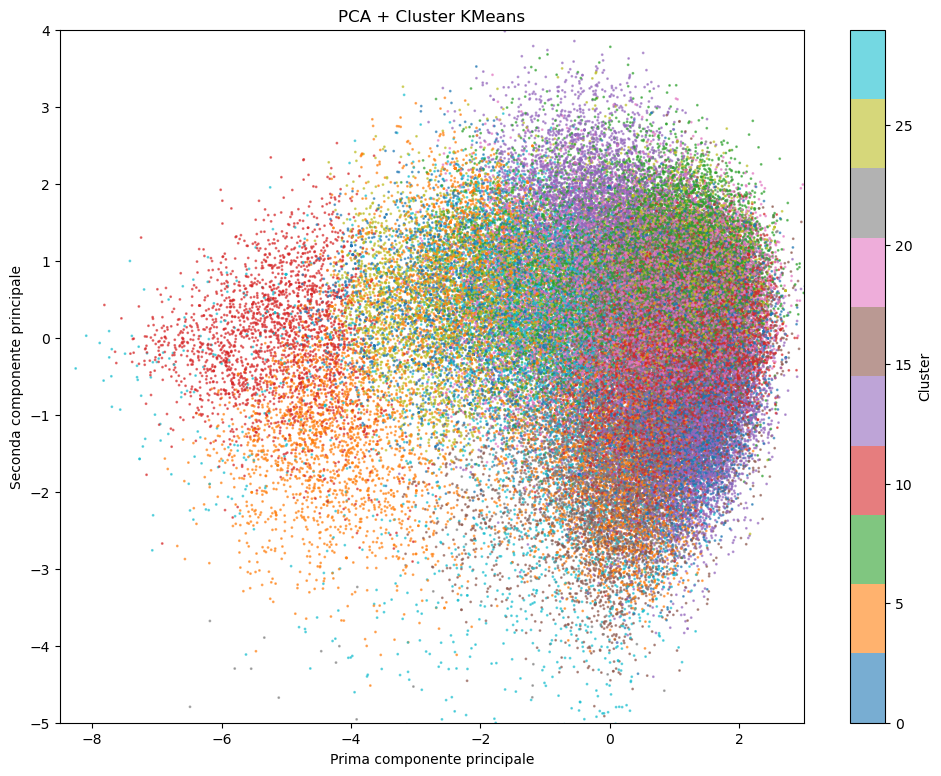

In [ ]:
from sklearn.decomposition import PCA

# 3. PCA (prendiamo tutte le componenti ma poi plottiamo solo le prime 2)
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Varianza spiegata
explained_var = pca.explained_variance_ratio_

print("Varianza spiegata da ciascuna componente PCA:")
for i, v in enumerate(explained_var):
    print(f"  PC{i+1}: {v:.4f}")

# 4. Scatter plot delle prime due componenti
plt.figure(figsize=(12,9))
plt.scatter(
    X_pca[:,0],
    X_pca[:,1],
    c=df['cluster'],        # Colore in base al cluster
    cmap='tab10',           # Puoi cambiare mappa colori
    s=1,                    # dimensione punti leggermente più visibile
    alpha=0.6
)
plt.xlabel("Prima componente principale")
plt.ylabel("Seconda componente principale")
plt.xlim(-8.5,3)
plt.ylim(-5,4)
plt.title("PCA + Cluster KMeans")
plt.colorbar(label='Cluster')  # legenda colori
plt.show()

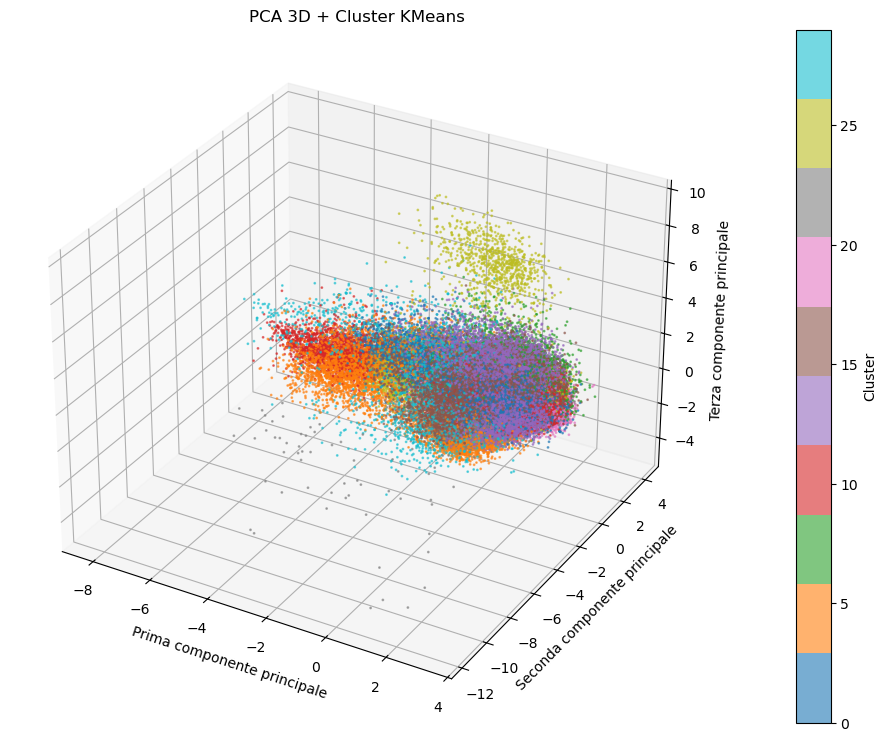

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # necessario per grafici 3D

fig = plt.figure(figsize=(12,9))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
sc = ax.scatter(
    X_pca[:,0], 
    X_pca[:,1], 
    X_pca[:,2],  # terza componente principale
    c=df['cluster'], 
    cmap='tab10', 
    s=1,        # dimensione punti leggermente più visibile
    alpha=0.6
)

ax.set_xlabel("Prima componente principale")
ax.set_ylabel("Seconda componente principale")
ax.set_zlabel("Terza componente principale")
ax.set_title("PCA 3D + Cluster KMeans")

# Colorbar
cbar = plt.colorbar(sc, ax=ax, pad=0.1)
cbar.set_label('Cluster')

plt.show()

In [ ]:
import plotly.express as px
import pandas as pd

# Assumendo che X_pca sia un array numpy con le prime 3 componenti principali
# e df['cluster'] contenga i cluster assegnati
df_plot = pd.DataFrame({
    'PC1': X_pca[:,0],
    'PC2': X_pca[:,1],
    'PC3': X_pca[:,2],
    'Cluster': df['cluster']
})

fig = px.scatter_3d(
    df_plot, 
    x='PC1', 
    y='PC2', 
    z='PC3', 
    color='Cluster', 
    color_continuous_scale='Turbo',  # o 'tab10' se vuoi colori discreti
    opacity=0.7,
    size_max=2
)
fig.update_traces(marker=dict(size=1))  # dimensione fissa dei punti
fig.update_layout(
    title="PCA 3D + Cluster KMeans",
    scene=dict(
        xaxis_title='Prima componente principale',
        yaxis_title='Seconda componente principale',
        zaxis_title='Terza componente principale'
    )
)

fig.show()

## hdbscan

In [ ]:
from sklearn.metrics import pairwise_distances
import hdbscan

# Calcolare la distanza coseno
distances = pairwise_distances(X_scaled_sample, metric='cosine')

# Applicare HDBSCAN usando le distanze pre-calcolate
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=10,   # dimensione minima cluster
    min_samples=5,         # sensibilità al rumore
    metric='precomputed'   # 'precomputed' indica che passeremo una matrice di distanze
)

labels = clusterer.fit_predict(distances)

In [ ]:
import pandas as pd

df_sample['cluster'] = labels
df_sample.select_dtypes(include=['number']).groupby('cluster').mean()       # caratteristiche medie per cluster
df_sample['cluster'].value_counts()       # dimensione dei cluster

cluster
 0    7552
-1    2436
 1      12
Name: count, dtype: int64

In [ ]:
import hdbscan

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=10,   # minimo cluster
    min_samples=5,        # sensibilità al rumore
    metric='manhattan'
)
labels = clusterer.fit_predict(X_scaled_sample)

# labels = -1 → rumore


In [ ]:
import pandas as pd

df_sample['cluster'] = labels
df_sample.select_dtypes(include=['number']).groupby('cluster').mean()       # caratteristiche medie per cluster
df_sample['cluster'].value_counts()       # dimensione dei cluster

cluster
 0    9348
-1     589
 1      63
Name: count, dtype: int64

In [ ]:
df.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre', 'target'],
      dtype='object')